# IMG2IMG

### Хотим предоставлять возможность уже из готовых изображений генерировать новые, немного изменяя концепцию с помощью сопроводительного промпта

In [ ]:
!pip install diffusers -q
!pip install peft -q

from google.colab import drive
drive.mount('/content/gdrive')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 25.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 4.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 40.1 MB/s eta 0:00:00
Mounted at /content/gdrive


### К модели Image2Image можно подгружать те же веса LoRA, как и к Text2Image. Посмотрим на результаты двух оптимальных моделей (весов LoRA), которые показали себя наилучшим образом при генерации

In [ ]:
import PIL
import requests
import torch
from diffusers import StableDiffusionInstructPix2PixPipeline, EulerAncestralDiscreteScheduler
import peft

model_id = "timbrooks/instruct-pix2pix"
pipe1 = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None)
pipe1.to("cuda")
pipe1.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe1.scheduler.config)

pipe2 = StableDiffusionInstructPix2PixPipeline.from_pretrained(model_id, torch_dtype=torch.float16, safety_checker=None)
pipe2.to("cuda")
pipe2.scheduler = EulerAncestralDiscreteScheduler.from_config(pipe2.scheduler.config)

pipe1.load_lora_weights("/content/gdrive/MyDrive/GAZPROM_lora_blue_orange.safetensors", adapter_name = "color")
pipe1.load_lora_weights("/content/gdrive/MyDrive/GAZPROM_850_photo-000014.safetensors", adapter_name = "LCT")
pipe1.set_adapters(["color", "LCT"], adapter_weights = [0.5, 0.5])
pipe1.safety_checker = None
pipe1.requires_safety_checker = False

pipe2.load_lora_weights("/content/gdrive/MyDrive/GAZPROM_lora_Kolya.safetensors", adapter_name = "Kolya")
pipe2.load_lora_weights("/content/gdrive/MyDrive/GAZPROM_lora_Masha.safetensors", adapter_name = "Masha")
pipe2.set_adapters(["Kolya", "Masha"], adapter_weights = [0.5, 0.5])
pipe2.safety_checker = None
pipe2.requires_safety_checker = False

In [ ]:
import cv2
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

def open_image(url):
    image = PIL.Image.open(url)
    image = PIL.ImageOps.exif_transpose(image)
    image = image.convert("RGB")
    image = cv2.resize(np.array(image), (512, 512), interpolation = cv2.INTER_LINEAR)
    image = Image.fromarray(image.astype('uint8'), 'RGB')
    return image

In [ ]:
import matplotlib.pyplot as plt

def compare_images(pipe1, pipe2, num_inference_steps, prompt, image):
  fig, axes = plt.subplots(len(num_inference_steps), 4)
  fig.set_size_inches(20, 20)
  for j, i in enumerate(num_inference_steps):
    images = pipe1(prompt, image = image, num_inference_steps = i).images[0]
    axes[j, 0].imshow(images)
    axes[j, 0].set_title(f'pipe1, steps {i}, scale default')
    images = pipe1(prompt, image = image, num_inference_steps = i, image_guidance_scale = 1).images[0]
    axes[j, 1].imshow(images)
    axes[j, 1].set_title(f'pipe1, steps {i}, scale 1')
    images = pipe2(prompt, image = image, num_inference_steps = i).images[0]
    axes[j, 2].imshow(images)
    axes[j, 2].set_title(f'pipe2, steps {i}, scale default')
    images = pipe2(prompt, image = image, num_inference_steps = i, image_guidance_scale = 1).images[0]
    axes[j, 3].imshow(images)
    axes[j, 3].set_title(f'pipe2, steps {i}, scale 1')
  plt.show()

# Изменение цвета

### Изменим цвет машины

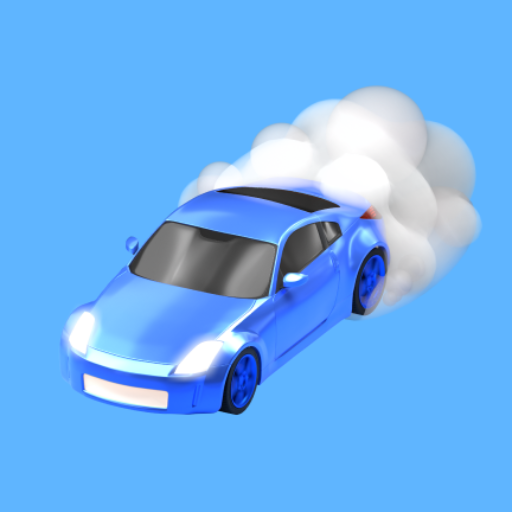

In [ ]:
Image.open('/content/32.png')

  0%|          | 0/10 [00:00<?, ?it/s]

/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,


  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

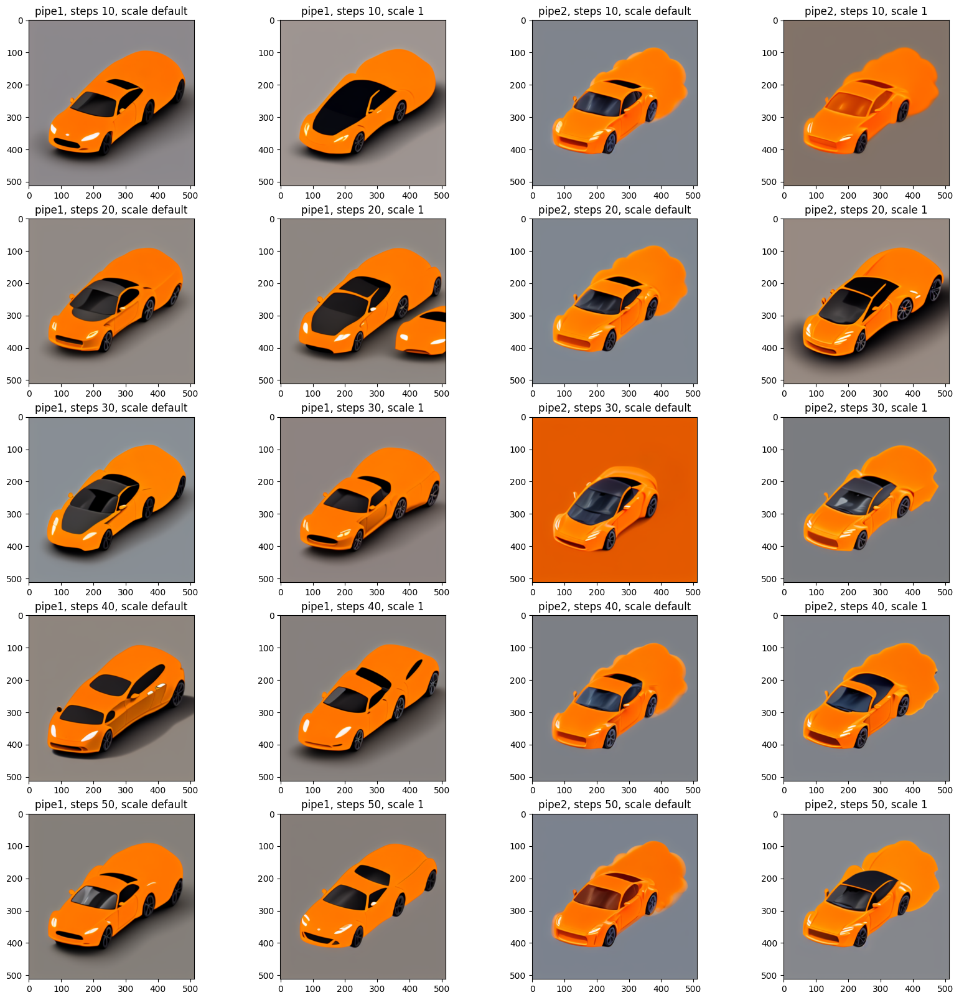

In [ ]:
compare_images(pipe1, pipe2, [10, 20, 30, 40, 50], 'orange fast car', open_image('/content/32.png'))

# Смена объекта

### Сменим кошку на собаку

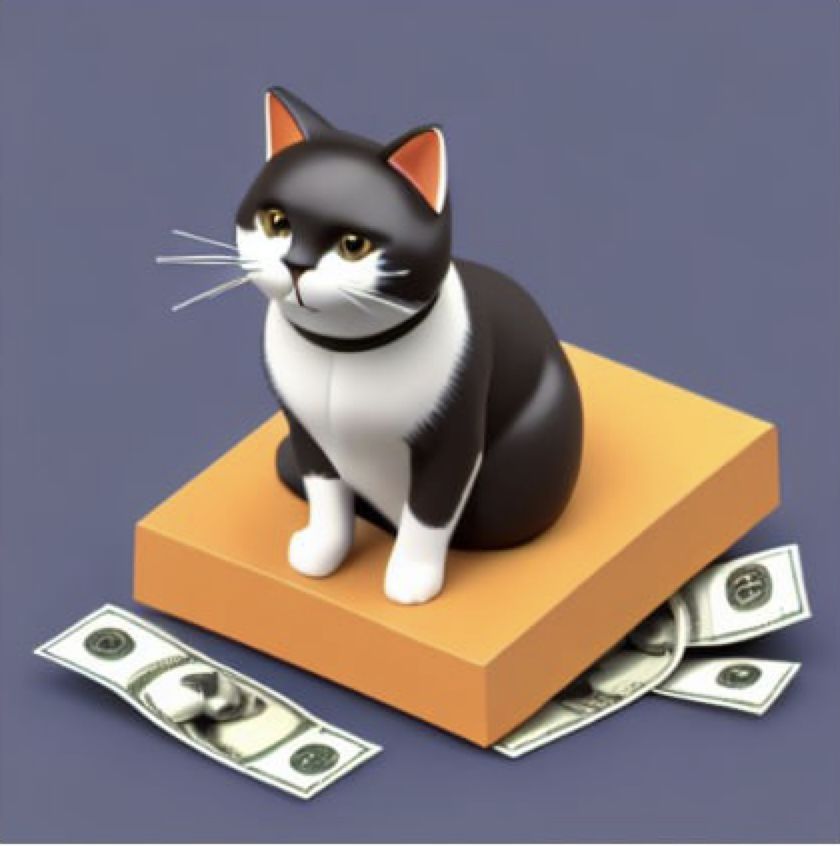

In [ ]:
Image.open('cat.png')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

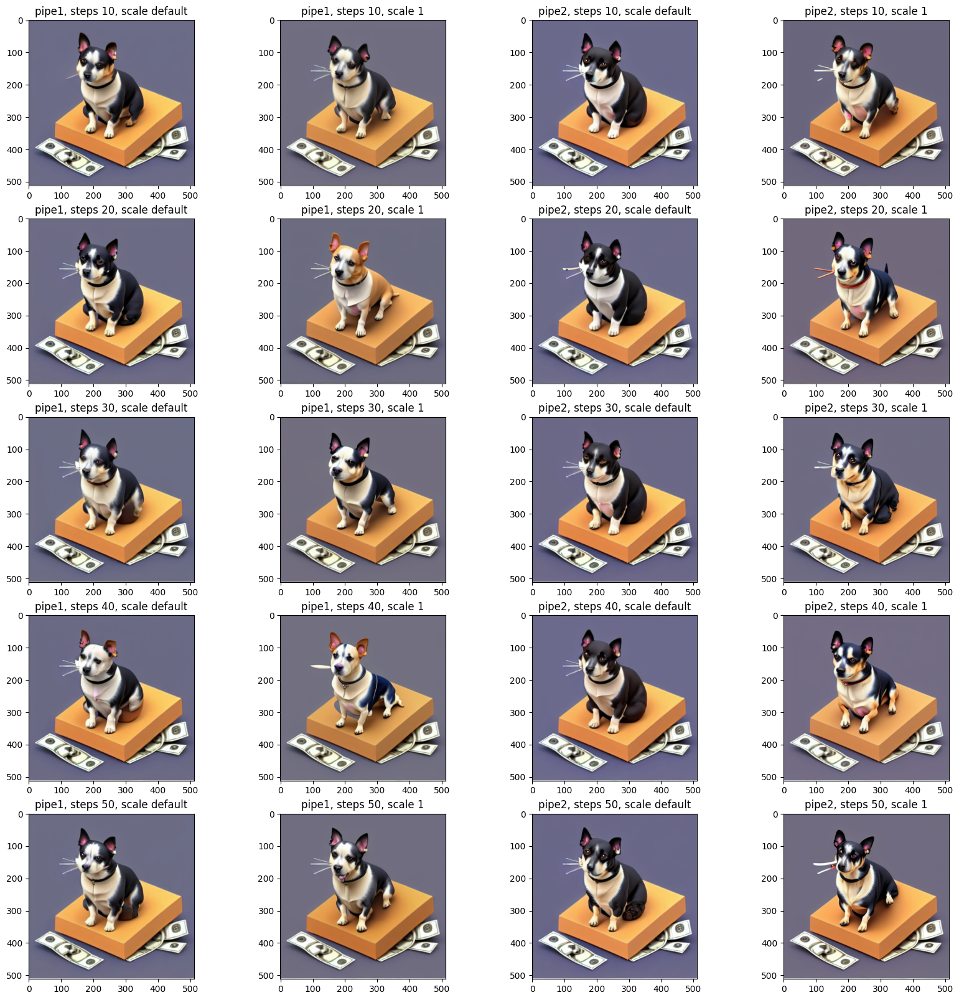

In [ ]:
compare_images(pipe1, pipe2, [10, 20, 30, 40, 50], 'dog', open_image('/content/cat.png'))

# Удаление объекта

### Удалить стопку монет, поменять цвет вазы и тюльпанов на белый

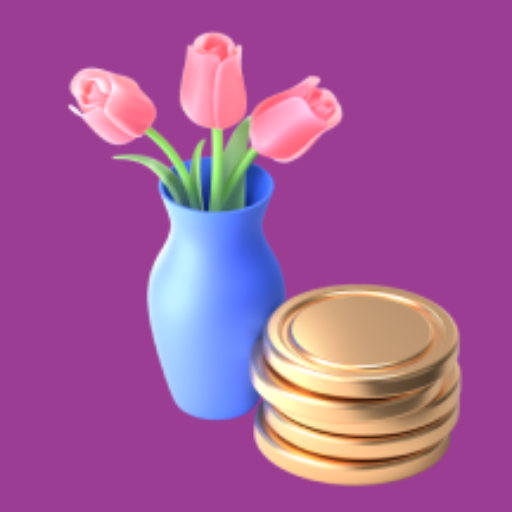

In [ ]:
Image.open('/content/3.png')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

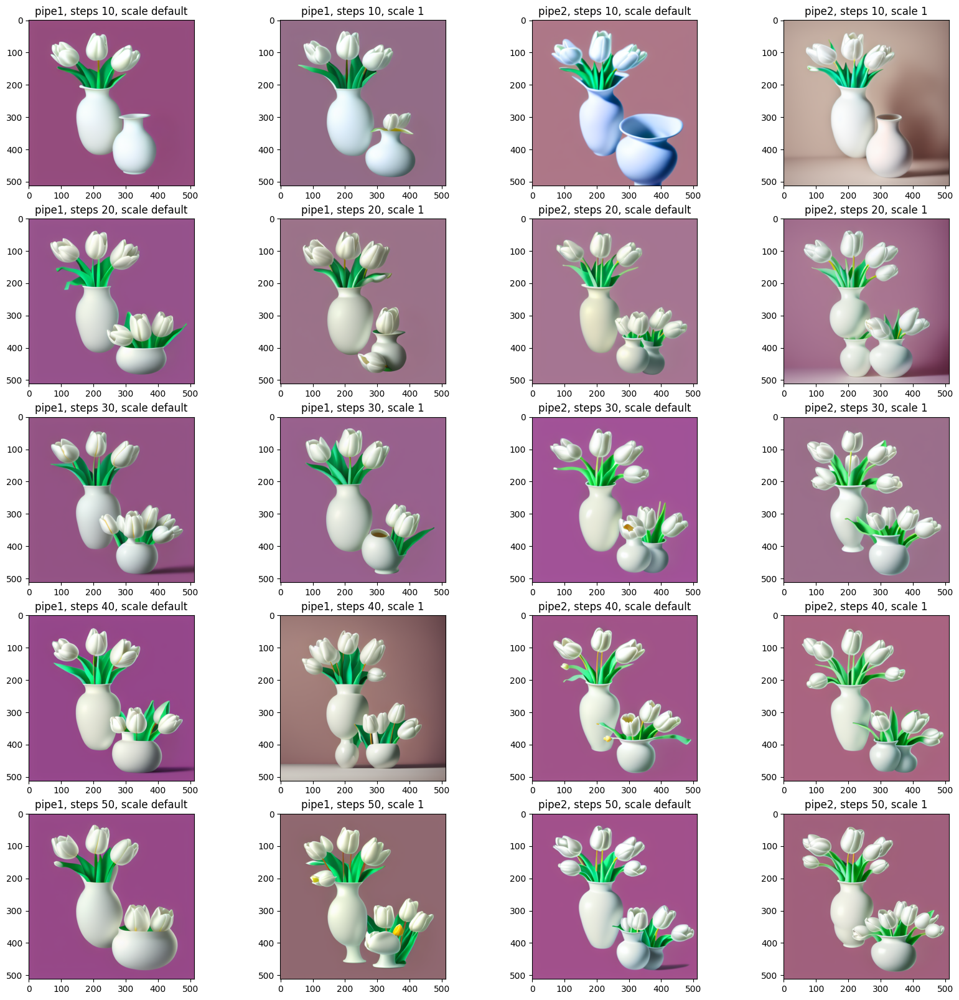

In [ ]:
compare_images(pipe1, pipe2, [10, 20, 30, 40, 50], 'white tulips in vase', open_image('/content/3.png'))

# Замена второстепенного объекта

### Пусть вместо стопки монет располагаются ключи от машины

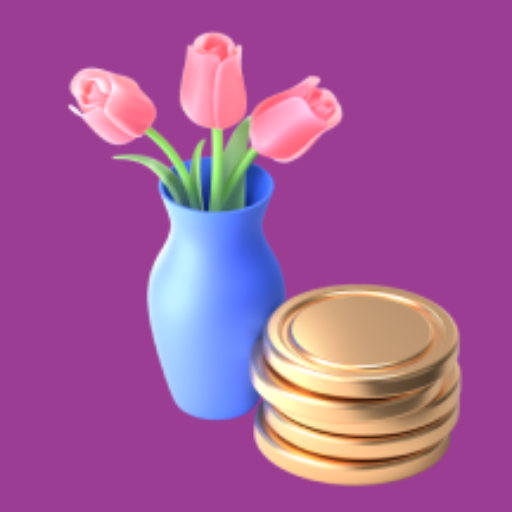

In [ ]:
Image.open('/content/3.png')

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

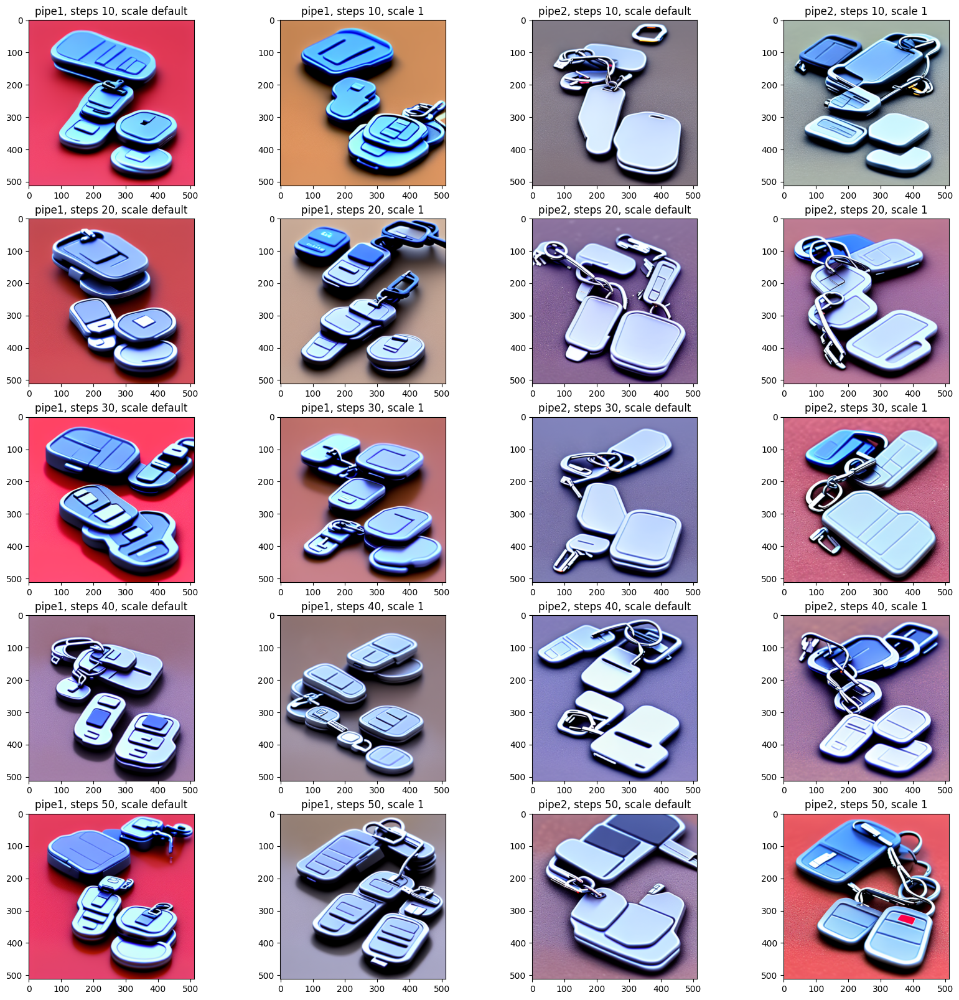

In [ ]:
compare_images(pipe1, pipe2, [10, 20, 30, 40, 50], 'change the stack of coins to car keys', open_image('/content/3.png'))

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/30 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/40 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

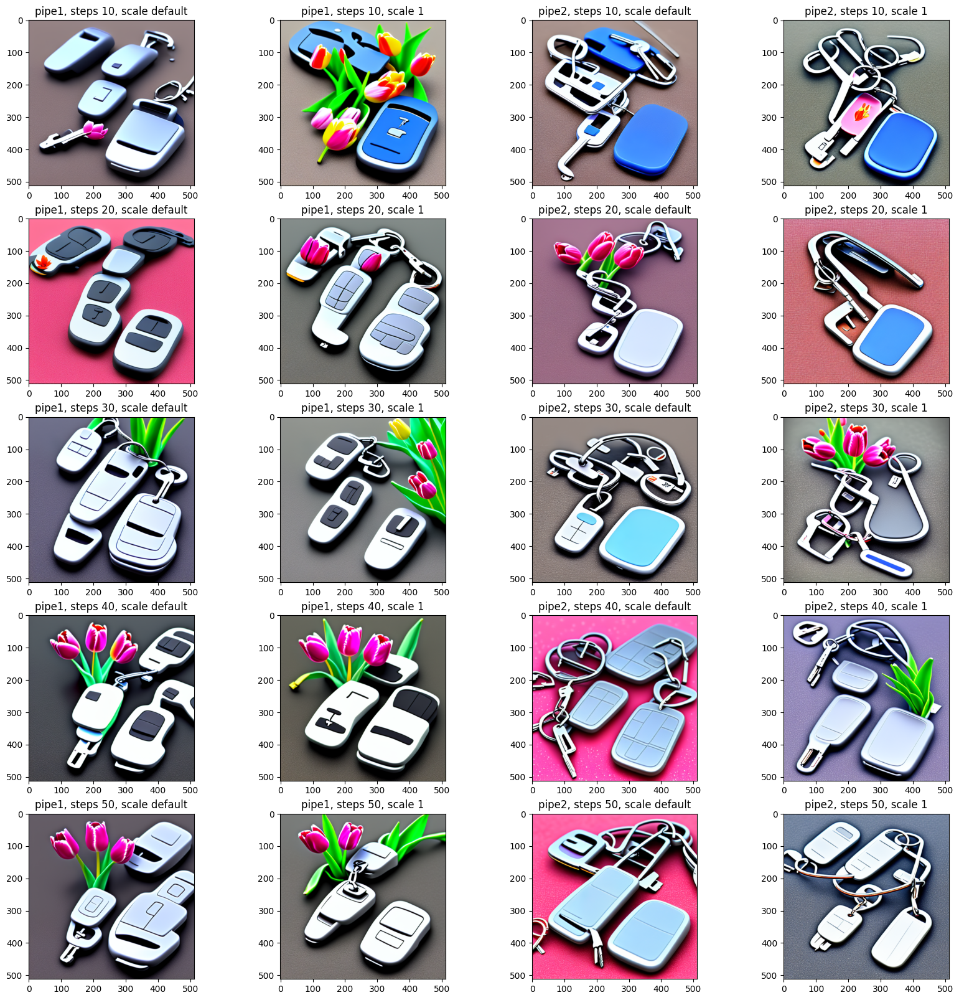

In [ ]:
compare_images(pipe1, pipe2, [10, 20, 30, 40, 50], 'tulips and car keys', open_image('/content/3.png'))